# 二項分布モデルでのP値函数のグラフ

## WilsonのP値函数の場合

In [1]:
using Distributions
using StatsPlots
default(fmt=:png, titlefontsize=10, tickfontsize=6, guidefontsize=9)

function pvalue_bin_wilson(k, p; n=20)
    z = (k - n*p)/√(n*p*(1 - p))
    2ccdf(Normal(), abs(z))
end

pvalue_bin_wilson (generic function with 1 method)

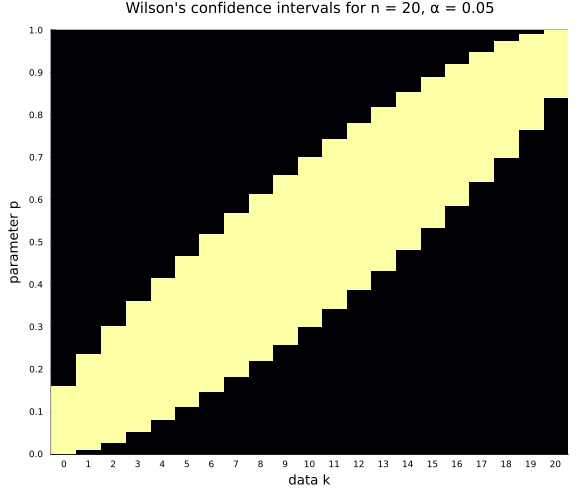

In [2]:
n = 20
α = 0.05
x = range(-0.5, n+0.5, 500)
p = range(0, 1, 500)
heatmap(x, p, (x, p)->pvalue_bin_wilson(round(x), p; n) ≥ α;
    clim=(0, 1), colorbar=false)
plot!(xguide="data k", yguide="parameter p")
plot!(xtick=0:n, ytick=0:0.1:1)
title!("Wilson's confidence intervals for n = $n, α = $α")
plot!(size=(580, 500))

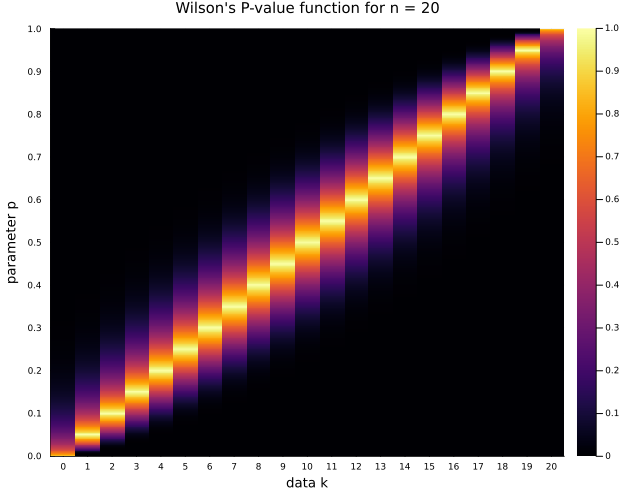

In [3]:
n = 20
x = range(-0.5, n+0.5, 500)
p = range(0, 1, 500)
heatmap(x, p, (x, p)->pvalue_bin_wilson(round(x), p; n); clim=(0, 1))
plot!(xguide="data k", yguide="parameter p")
plot!(xtick=0:n, ytick=0:0.1:1)
title!("Wilson's P-value function for n = $n")
plot!(size=(640, 500))

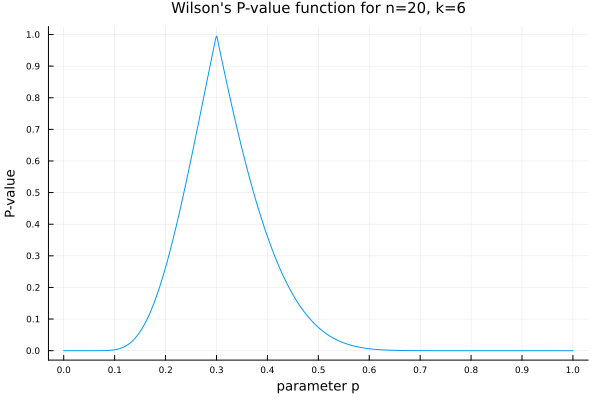

In [4]:
n, k = 20, 6
p = range(0, 1, 500)
plot(p, p -> pvalue_bin_wilson(k, p; n); label="")
plot!(xguide="parameter p", yguide="P-value")
plot!(xtick=0:0.1:1, ytick=0:0.1:1)
title!("Wilson's P-value function for n=$n, k=$k")

 60.229527 seconds (44.33 M allocations: 1.159 GiB, 0.31% gc time, 2.87% compilation time: 25% of which was recompilation)


┌ Info: Saved animation to 
│   fn = D:\OneDrive\public\0038\Wilson's P-value function n=20 (60).gif
└ @ Plots D:\.julia\packages\Plots\CUQan\src\animation.jl:139


Plots.AnimatedGif("D:\\OneDrive\\public\\0038\\Wilson's P-value function n=20 (60).gif")
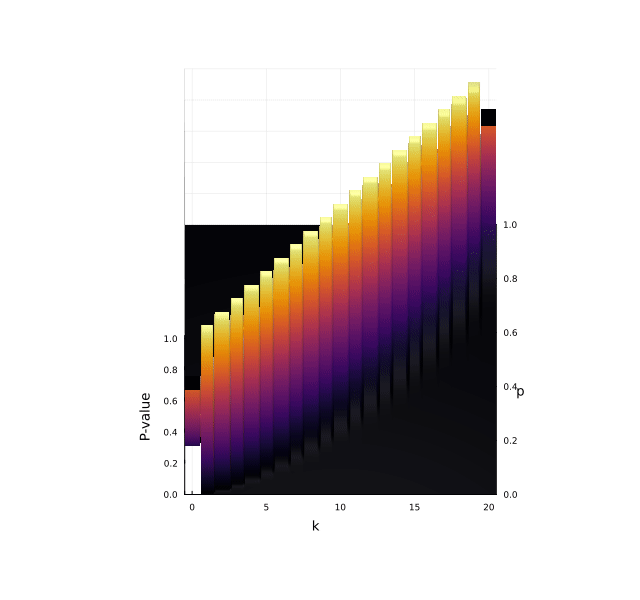

In [5]:
n = 20
x = range(-0.5, n+0.5, 211)
p = range(0, 1, 201)
@time anim = @animate for t in 0:3:359
    surface(x, p, (x, p)->pvalue_bin_wilson(round(x), p; n); colorbar=false, camera=(t, 60))
    plot!(xguide="k", yguide="p", zguide="P-value")
    plot!(size=(640, 600), zlim=(0, 1))
end
gif(anim, "Wilson's P-value function n=$n (60).gif")

 59.597564 seconds (36.73 M allocations: 765.951 MiB, 0.17% gc time, 0.04% compilation time)


┌ Info: Saved animation to 
│   fn = D:\OneDrive\public\0038\Wilson's P-value function n=20 (45).gif
└ @ Plots D:\.julia\packages\Plots\CUQan\src\animation.jl:139


Plots.AnimatedGif("D:\\OneDrive\\public\\0038\\Wilson's P-value function n=20 (45).gif")
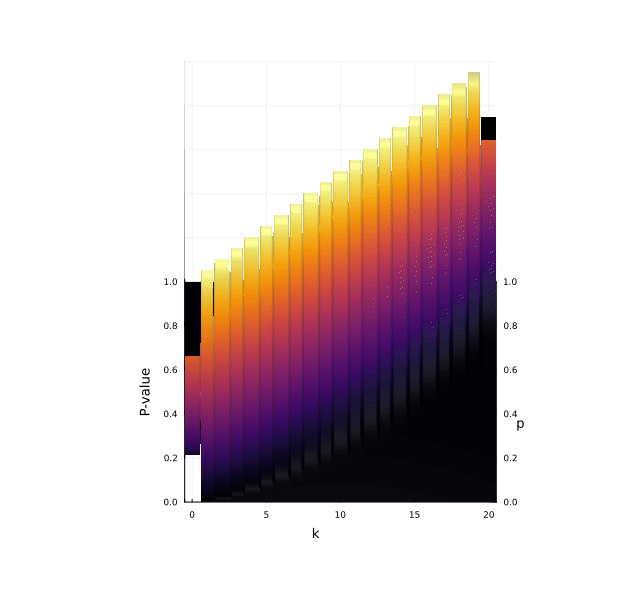

In [6]:
n = 20
x = range(-0.5, n+0.5, 211)
p = range(0, 1, 201)
@time anim = @animate for t in 0:3:359
    surface(x, p, (x, p)->pvalue_bin_wilson(round(x), p; n); colorbar=false, camera=(t, 45))
    plot!(xguide="k", yguide="p", zguide="P-value")
    plot!(size=(640, 600), zlim=(0, 1))
end
gif(anim, "Wilson's P-value function n=$n (45).gif")

## WilsonのP値函数とClopper-PeasonのP値函数とベイズ版P値函数の比較

In [7]:
using Distributions
using StatsPlots
default(fmt=:png,
    titlefontsize=10, tickfontsize=6, guidefontsize=9, legendfontsize=9)
safediv(x, y) = x==0 ? x : y==0 ? oftype(x, Inf) : x/y

# WilsonのP値函数
function pvalue_bin_wilson(k, p; n=20)
    z = safediv(k - n*p, √(n*p*(1 - p)))
    2ccdf(Normal(), abs(z))
end

# Clopper-PearsonのP値函数
function pvalue_bin_cp(k, p; n=20)
    bin = Binomial(n, p)
    min(1, 2cdf(bin, k), 2ccdf(bin, k-1))
end

# 事前分布Beta(γ, δ)によるBayes版のP値函数(equal-tailed interval版)
function pvalue_bin_bayesian_eti(k, p; n=20, γ=1, δ=1)
    beta = Beta(k+γ, n-k+δ)
    min(1, 2cdf(beta, p), 2ccdf(beta, p))
end

function plot_pvalue_functions(; n=20, k=6, γ=1, δ=1, kwargs...)
    p = range(0, 1, 500)
    plot(p, p -> pvalue_bin_wilson(k, p; n); label="Wilson")
    plot!(p, p -> pvalue_bin_cp(k, p; n); label="Clopper-Pearson", ls=:dash)
    plot!(p, p -> pvalue_bin_bayesian_eti(k, p; n, γ, δ); label="Bayesan", ls=:dashdot)
    plot!(xguide="parameter p", yguide="P-value")
    plot!(xtick=0:0.1:1, ytick=0:0.1:1)
    title!("P-value functions for n=$n, k=$k, prior=Beta($γ, $δ)")
    plot!(; kwargs...)
end

plot_pvalue_functions (generic function with 1 method)

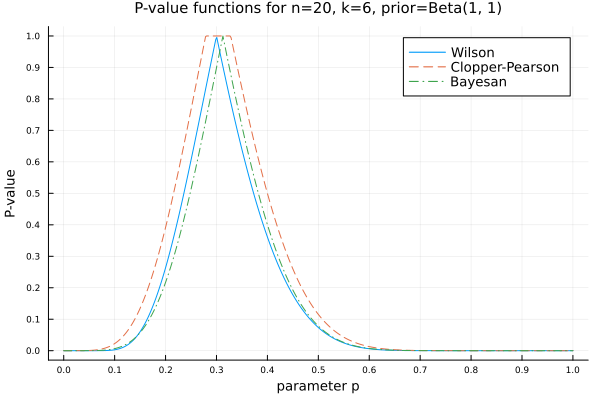

In [8]:
plot_pvalue_functions(; n=20, k=6, γ=1, δ=1)

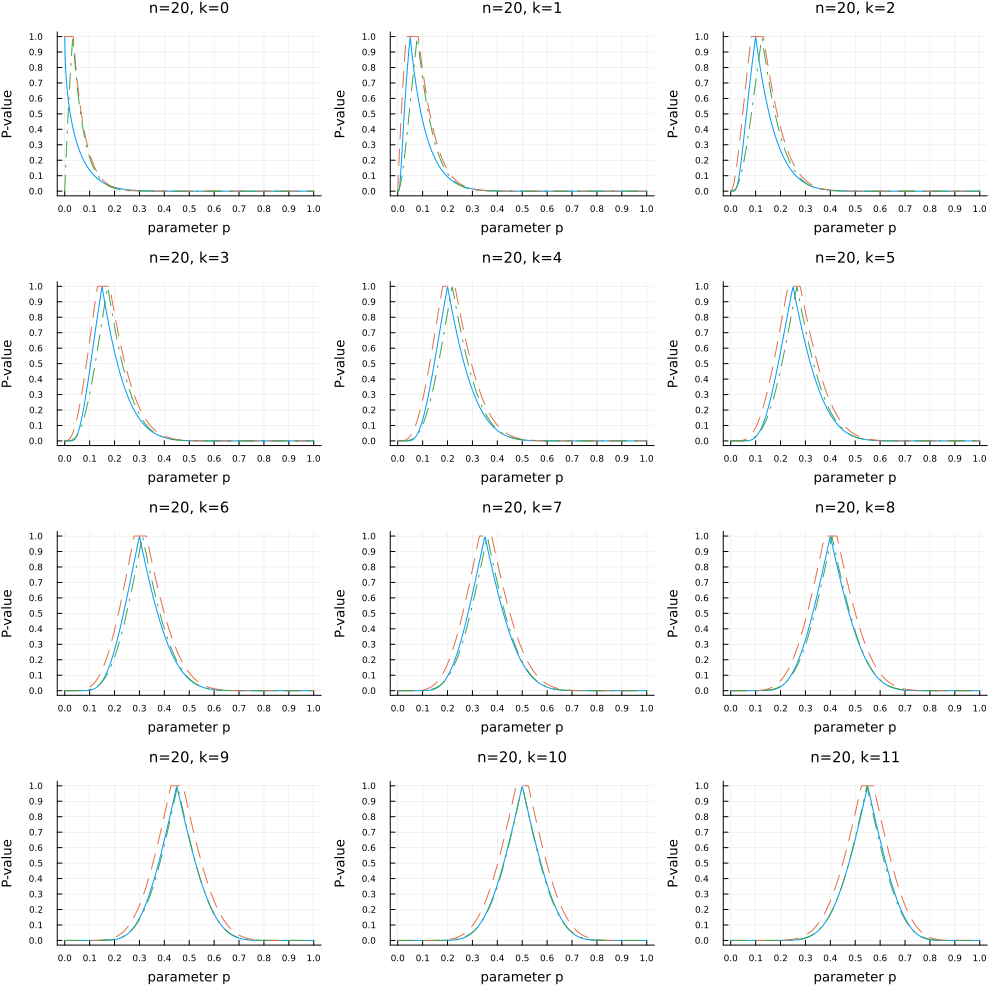

In [9]:
PP = []
for k in 0:11
    P = plot_pvalue_functions(; n=20, k, title="n=$n, k=$k", legend=false)
    push!(PP, P)
end
plot(PP...; size=(1000, 1000), layout=(4, 3))
plot!(legend=false)

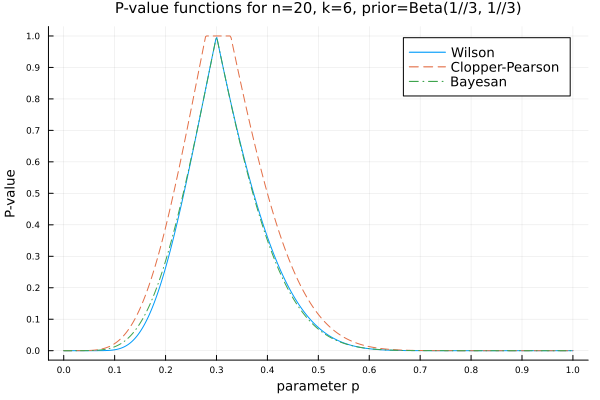

In [10]:
plot_pvalue_functions(; n=20, k=6, γ=1//3, δ=1//3)

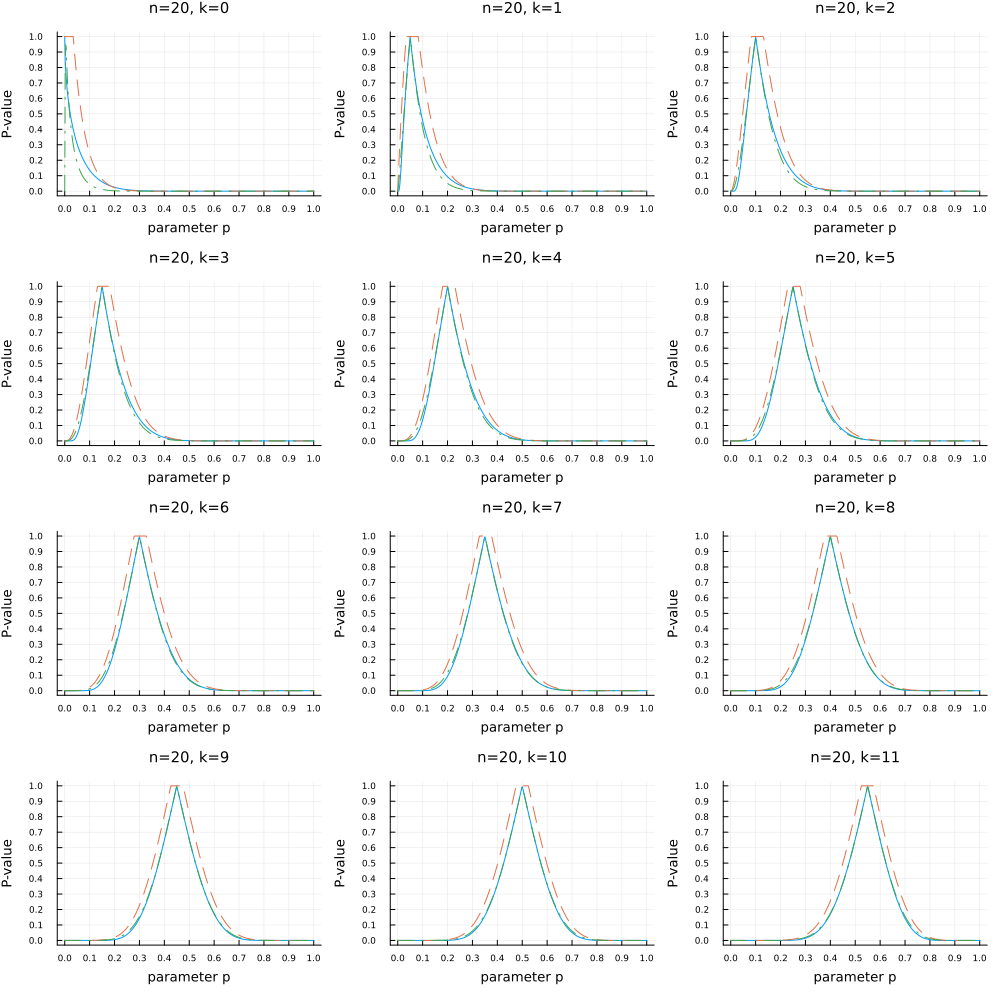

In [11]:
PP = []
for k in 0:11
    P = plot_pvalue_functions(; n=20, k, γ=1//3, δ=1//3, title="n=$n, k=$k", legend=false)
    push!(PP, P)
end
plot(PP...; size=(1000, 1000), layout=(4, 3))
plot!(legend=false)